Θα συνιστούσα την εκτέλεση όλου του κώδικα, καθώς υπάρχουν σημεία, όπως την περίπτωση του devisive αλγότιθμου, τα οποία παίρνουν 6 λεπτά για να τρέξουν.

# PART A

In [1]:
import community
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import math

# Read the GML file into a string (use your own path)
with open('/content/polblogs.gml', "r") as f:
    gml_string = f.read()

# Create an empty directed graph 
G = nx.DiGraph()


In [2]:
#There are duplicated edges causing the read_gml function to malfunction. I will create a parser that dumps duplicate edges 

# Reading the file and spliting in lists containing nodes and edges, with each node having its value as label and then we manually add them to our graph

#Nodes 
node_strings = gml_string.split("node ")[1:]
for node_string in node_strings:
  try:
    node_id = int(node_string.split("id")[1].split()[0])
    G.add_node(node_id, label = int(node_string.split("value ")[1].split()[0]))
  except (IndexError, ValueError):
    continue
  G.add_node(node_id, label = int(node_string.split("value ")[1].split()[0]))

#Edges 
edge_strings = gml_string.split("edge")[1:]
for edge_string in edge_strings:
    try:
        source_id = int(edge_string.split("source")[1].split()[0])
        target_id = int(edge_string.split("target")[1].split()[0])
    except (IndexError, ValueError):
        continue
    if not G.has_edge(source_id, target_id):
        G.add_edge(source_id, target_id)

In [3]:
# As we said, I will use the biggest strongly connected component for the clustering
# Get the list of strongly connected components
connected_components = list(nx.strongly_connected_components(G))

# Find the largest connected component
largest_component = max(connected_components, key=len)

# Get the subgraph for the largest connected component
largest_subgraph = G.subgraph(largest_component)

# Get the label values for each node
node_labels = nx.get_node_attributes(largest_subgraph, "label")

In [4]:
# I want to find my ground truth communities as lists, so first im creating an new dict having as keys the values of my node_labels and 
# as values, the list of the nodes that had the same label
new_dict = {}
for value in set(node_labels.values()):
    new_dict[value] = []
for key, value in node_labels.items():
    new_dict[value].append(key)

# And now creating the list of our communities 
communities_ground_truth = [[value for value in values] for values in new_dict.values()]

In [5]:
# Saving the largest component as our new graph G and converting it to undirected type
G = largest_subgraph.to_undirected()

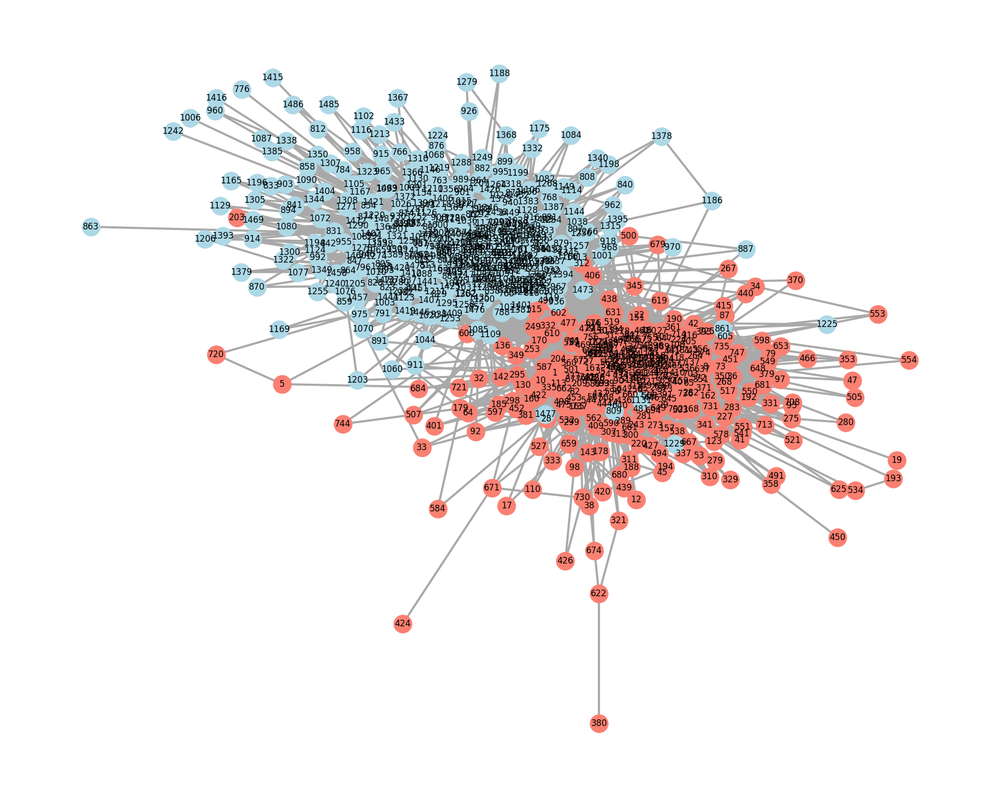

In [6]:
# We have 2 ground truth communities so we are using two colors in order to plot the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_ground_truth, colors):
    nx.draw_networkx_nodes(largest_subgraph, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G, pos=pos)
_ = plt.axis('off')

Από την παραπάνω γραφική παράσταση του γράφου, μπορούμε να παρατηρήσουμε ότι οι δύο κοινότητες φαίνεται να ξεχωρίζουν, όσον αφορά την τιμή των ετικετών τους.

In [7]:
# We are creating a dictionary to save the ground truth labels for each node
label_dict = {}
for node in G.nodes:
  label_dict[node] = G.nodes[node]['label']


In [8]:
# We will store all of our information in a dataframe so that we can manipulate it easier
df = pd.DataFrame.from_dict(label_dict, orient='index',columns=['ground_truth_labels'])

In [9]:
# We now creating a copy of the previous srongly connected component without labels in order to cluster the nodes 
G_no_labels = G.copy()
for node in G_no_labels.nodes():
    del G_no_labels.nodes[node]['label']

In [10]:
# We can see that the new graph has the same number of nodes as the original
len(G_no_labels.nodes)

793

# Τεχνικές εντοπισμού κοινοτήτων 

Θα παραστούμε κάθε φορά τις κοινότητες που εμφανίζονται με communities_i_list , όπου i θα είναι ο αλγόριθμος εντοπισμός κοινωτήτων που αντιστοιχίζεται στο i ερώτημα του πρώτου μέρους της εργασίας. 

# ΕΥΡΕΣΗ ΚΛΙΚΑΣ

Εδω πέρα χρησιμοποιούμε τον αλγόριθμο **Clique Percolation Method**. 
Ουσιαστικά αυτό που κάνει είναι να βρει όλες τις κλίκες του γράφου και αφού επιλέξουμε τον αριθμό του μήκους της κλίκας που θέλουμε, στην προκειμένη περίπτωση 3, να κατασκευάσει έναν καινούργιο γράφο. Σε αυτόν τον γράφο, κόμβοι πλεόν θα αποτελούν οι κλίκες που θα βρει ο αλγόριθμος, και δύο κόμβοι θα συνδέονται μεταξύ τους, αν οι αντίστοιχες κλίκες έχουν δύο κοινούς κόμβους από τον γράφο τον οποίο θέλουμε να κάνουμε το cοmmunity detection. Αφού κατασκευαστεί αυτός ο γράφος, δημιουργύνται τόσα communities όσα και οι συνεκτικές συνιστώσες του γράφου, με κάθε κόμβο ο οποίος ανήκει σε μία κλίκα μίας συνιστώσας.

Παρακάτω αναφέρεται ο τρόπος που εφάρμοσα αυτόν τον αλγόριθμο, χωρίς να το παραστήσω γραφικά, καθώς βρέθηκαν 389 συνολικά communities και δεν θα μπορούσαμε να δούμε καλά αποτελέσματα.  

In [11]:
# Find all cliques and then filter only these with 3 nodes
cliques = list(nx.find_cliques(G))

# Storing all 3-cliques of our graph in a dictionary 
k_cliques={}
for ind, c in enumerate(cliques):
  if len(cliques[ind]) == 3:
    k_cliques[ind] = c


In [12]:
# And now creating the graph with cliques as nodes
clique_graph=nx.Graph()
# Add nodes to the graph
for node in k_cliques.keys():
    clique_graph.add_node(node)

# Add edges to the graph
for node1 in k_cliques.keys():
    for node2 in k_cliques.keys():
        if node1 != node2 and len(set(k_cliques[node1]).intersection(set(k_cliques[node2])))==2:
            clique_graph.add_edge(node1, node2)

# Find the connected components
cc = list(nx.connected_components(clique_graph))

In [13]:
len(cc)

244

In [14]:
# There are total 244 communities for this problem.
# And now we have to assign clusters on our connected components,in order to assign the nodes of each component in the same cluster
label_dict_a={}
cluster = 1 
for con_comp in cc:
  for node in list(con_comp):
    label_dict_a[node] = cluster
  cluster += 1 

In [15]:
final_label_dict_a={}
for key in label_dict_a.keys():
  for node in k_cliques[key]:
     
    # this is the way to check if two communites have overlapping nodes. If there are overlaps, then we dont have to assing a different value on the final_label dictionary
    if node in final_label_dict_a.keys():
      pass
    
    # Else we assign each node a cluster value
    else:
      final_label_dict_a[node] = label_dict_a[key]
    

In [16]:
# We can see that only the 580 nodes of the total 793 got into clusters because of the fact that we picked only 3-cliques. 
len(final_label_dict_a)


580

In [17]:
#So we have to assign on the other clusters a different value for each. 
for key in label_dict.keys():
  if key in final_label_dict_a.keys():
    pass
  else:
    final_label_dict_a[key] = cluster
    cluster += 1

In [18]:
# We can see that we have 389 total clusters, so plotting this won't give us any information
len(set(final_label_dict_a.values()))

389

In [19]:
# And now appending the labels in our previous dataframe 
df['Clique_Method'] = None

for key, value in final_label_dict_a.items():
    df.loc[key, 'Clique_Method'] = value

In [20]:
# And now creating the communities_a

value_dict = {}
# loop over the key-value pairs in the dictionary
for key, value in final_label_dict_a.items():
    # check if the value is already in the value_dict
    if value in value_dict:
        # if so, append the current key to the list of keys with that value
        value_dict[value].append(key)
    else:
        # if not, create a new list with the current key as the only element
        value_dict[value] = [key]

# create the communities list
communities_a_list = [value_dict[value] for value in value_dict]


# Max Modularity 

Εδώ πέρα επιλέχθηκε ο άπληστος αλγόριθμος Clauset-Newman. Αυτό που κάνει ο αλγόριθμος αρχικά είναι ότι υπολογίζει το κέρδος του δικτύου σε modularity, αν δίωξει κάποιον ή κάποιους κόμβο/ους από την γειτονία κάποιου άλλου και τον/τους στείλει σε κάποια άλλη γειτονιά. Ο ορισμός του modularity παραλείπεται, καθώς θα τον έκανα αντιγραφή επικόλληση από το αρχείο το οποίο μας ήταν διαθέσιμο. 

In [21]:
# We will use the algorithm from the hands_on example
#Clauset-Newman-Moore greedy modularity maximization
communities_b_list = list(nx.algorithms.community.greedy_modularity_communities(G_no_labels))

In [22]:
# We can see that this algorithm produced 4 clusters - communities
len(communities_b_list)

4

In [23]:
# Creating again the label_dict to store the label of each cluster
label_dict_b={}
for i, j in enumerate(communities_b_list):
  for value in j:
    label_dict_b[value] = i

# And now appending the labels in our previous dataframe 
df['Modularity_Method'] = None

for key, value in label_dict_b.items():
    df.loc[key, 'Modularity_Method'] = value

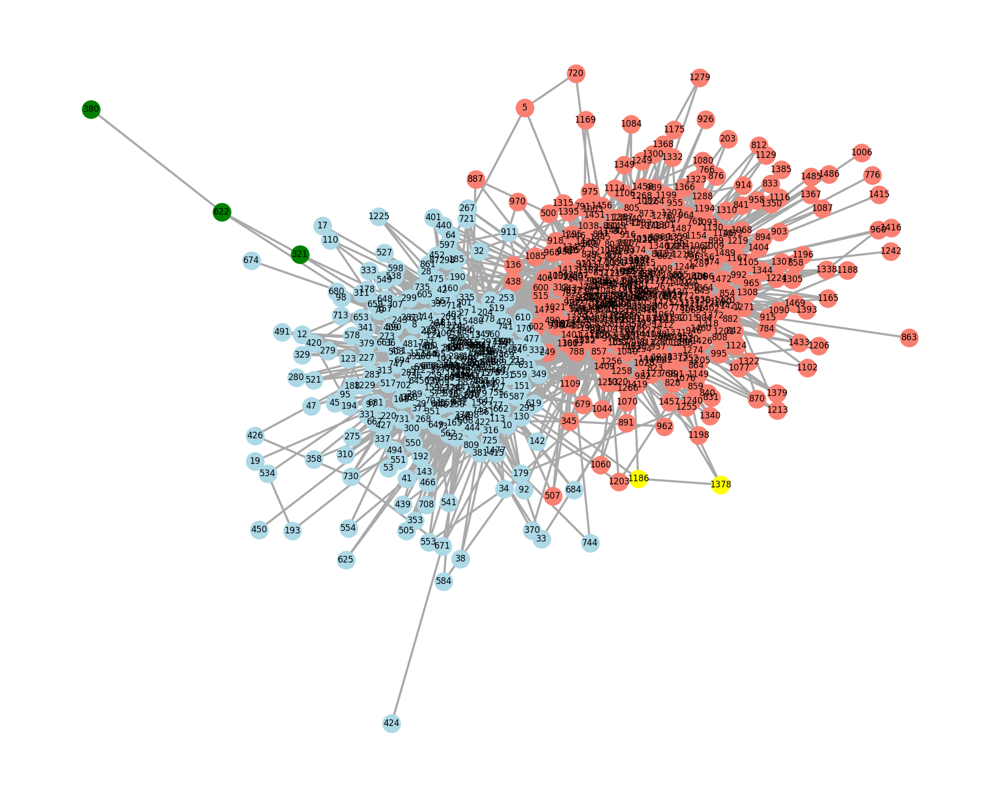

In [24]:
# We have 4 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue','green','yellow']
nx.draw_networkx_edges(G, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_b_list, colors):
    nx.draw_networkx_nodes(G, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G, pos=pos)
_ = plt.axis('off')

Από το γράφημα φαίνεται ότι έχουν δημιουργηθεί 2 communities, το κίτρινο και το πράσινο που ξεχωρίζουν από το υπόλοιπο δίκτυο.

# Agglomerative Hierearchical Clustering

Ο αλγόριθμος Agglomerative clustering χρησιμοποιεί τον πίνακα γειτνίασης του γράφου, για να δημιουργήσει τον επιθυμητό αριθμό των cluster σταδιακά. Πιο συγκεκριμένα, από τον πίνακα γειτνίασης καταλαβαίνει την μικρότερη απόσταση μεταξύ δύο κόμβων, και τους ενώνει μεταξύ τους σχηματίζοντας ενα cluster. Αυτή η διαδικασία επαναλαμβάνεται, έως ότου δημιουργηθεί τελικά το μεγαλύτερο cluster το οποίο περιέχει σύνολα από cluster. Ο αλγόριθμος χωρίζει το δέντρο ταξινόμησης που δημιουργείται στο επιθυμητό σημείο, ώστε να μας παρέχει την διαμέριση των communities στον επιθυμητό αριθμό, στην προκειμένη περίπτωση το 2.

In [25]:
# To cluster the nodes hierarchically, we use the agglomerative clustering algorithm from sklearn. 
from sklearn.cluster import AgglomerativeClustering

# Calculating the adjacency matrix of the graph and then finding the labels when using this clustering. 
A = nx.to_numpy_array(G_no_labels)
agg_clustering = AgglomerativeClustering(n_clusters=2, linkage='ward')
labels = agg_clustering.fit_predict(A)

# Finally, we save the labels on another column of our dataframe
df['Hierarchical_Clustering'] = labels

In [26]:
# And now we want to find the communities so that we can plot the graph
# Get the nodes where the value is 1
labels_1 = df.loc[df['Hierarchical_Clustering'] == 1].index.tolist()

# Get the nodes where the value is 0
labels_0 = df.loc[df['Hierarchical_Clustering'] == 0].index.tolist()

In [27]:
# And now appending the labels in a list 
communities_c_list = []
communities_c_list.append(labels_1)
communities_c_list.append(labels_0)

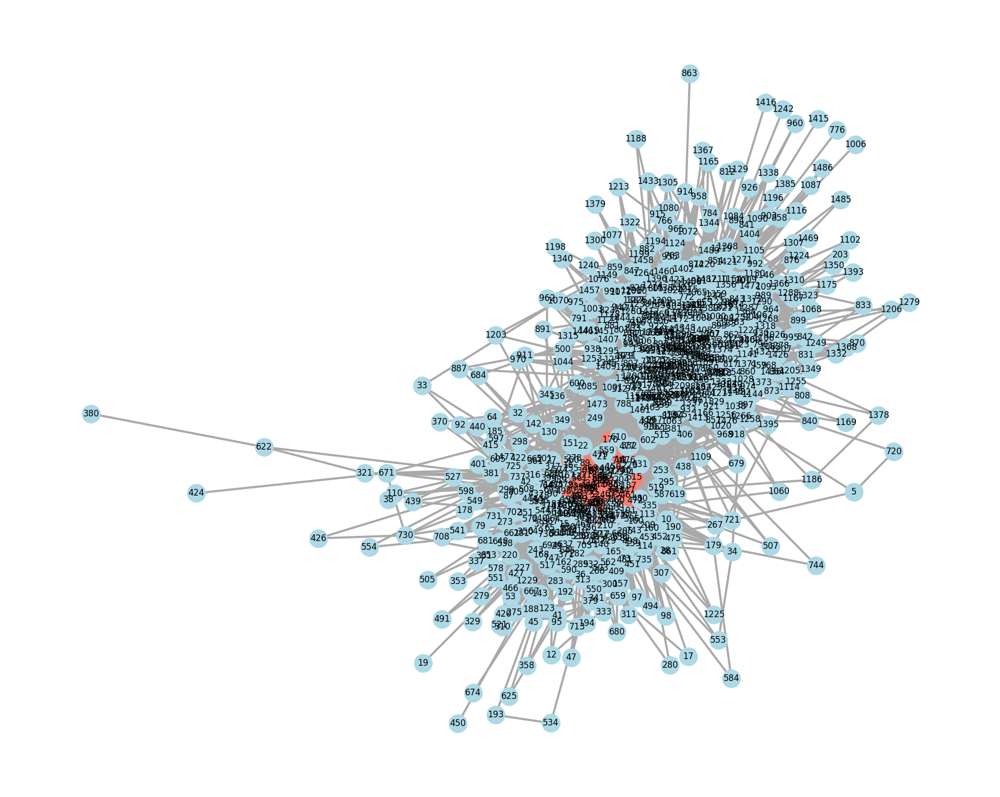

In [28]:
# We have 2 communities so we are using two colors in order to plot the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G_no_labels, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_c_list, colors):
    nx.draw_networkx_nodes(communities_c_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G_no_labels, pos=pos)
_ = plt.axis('off')

Όπως μπορούμε να παρατηρήσουμε, η ποιότητα του clustering δεν είναι καλή. Πιο συγκεκριμένα, βλέπουμε ένα community (κόκκινο) το οποίο επικαλύπτεται από το μεγαλύτερο community (γαλάζιο)

# Divisive Hierarchical Clustering

Εδώ πέρα επιλέχθηκε ο αλγόριθμος Clauset-Newman. Ο αλγόριθμος αυτός είναι ένας διαιρετικός αλγόριθμος, ο οποίος αφαιρεί ακμές από τον γράφο έως ότου να σχηματιστούν δύο συνεκτικές συνιστώσες, οπότε και δύο communities. Ο αλγόριθμος αυτός είναι ένας επαναληπτικός αλγόριθμος. Υπολογίζει τον ασθενέστερο δεσμό μεταξύ κόμβων όσον αφορά το betweeness τους, και αφαιρεί την ακμή που έχει το υψηλότερο betweeness. Υπολογίζει εκ νέου το betweeness των ακμών που απομένουν, και επαναλαμβάνει την ίδια διαδικασία υπολογισμών - διαγραφής, μέχρι να δημιουργηθούν δύο συνεκτικές συνιστώσες.

Σε αυτο το πρόβλημα, προσπαθώντας να εφαρμόσω αυτόν τον αλγόριθμο, το τελικό αποτέλεσμα ήταν ο χωρισμός σε δύο συνεκτικές συνιστώσες, με την μία να περιλαμβάνει μόνο δύο κόμβους.
Οπότε, προκειμένου να βγάλω καλύτερο αποτέλεσμα, χρησιμοποίησα και δεύτερη φορα αυτόν τον αλγόριθμο, χωρίς να υπάρξει κάποια διαφορά, αφού πάλι δημιούργησε μία συνιστώσα με 2 κόμβους. Αποφάσισα να το τρέξω ακόμα μία τελευταία φορά, πάλι όμως είχαμε παρόμοιο αποτέλεσμα, οπότε και σταμάτησα εκεί.

In [29]:
def girvan_newman(G):
    """ run the algorithm of Girvan + Newman up to the first separation
        and return list of components of G, list of edges removed
    """
    
    # we're going to remove edges, so do it on a copy of the original graph
    G = G.copy()
    def find_best_edge(G0):
        """ get the edge from G0 with highest betweenness centrality"""
        eb = nx.edge_betweenness_centrality(G0)
        edges = eb.keys()
        return max(edges, key=lambda e: eb[e])

    removed_edges = []
    # Proceed until we separate the graph
    while nx.number_connected_components(G) == 1:
        u, v = find_best_edge(G)
        G.remove_edge(u, v)
        removed_edges.append((u, v))

    return list(nx.connected_components(G)), removed_edges

In [30]:
# First separation
first_separation, first_edges = girvan_newman(G_no_labels)

In [31]:
first_separation[1]

{380, 622}

In [32]:
# We can see that the first separation only cut 2 nodes, so I will try to use the algorithm once more in another graph without these nodes
new_nodes = [n for n in G_no_labels.nodes() if n in first_separation[0]]
H = G_no_labels.subgraph(new_nodes)

In [33]:
# And now we separate again this graph
second_separation, second_edges = girvan_newman(H)

In [34]:
second_separation[1]

{193, 534}

In [35]:
new_nodes = [n for n in H.nodes() if n in second_separation[0]]
I = H.subgraph(new_nodes)

In [36]:
# And now we separate again this graph
third_separation, third_edges = girvan_newman(I)

In [37]:
third_separation[1]

{674}

In [38]:
# Now we create the communities for this part
communities_d_list=[]
communities_d_list.append(list(third_separation[0]))
communities_d_list.append(list(third_separation[1]))
communities_d_list.append(list(second_separation[1]))
communities_d_list.append(list(first_separation[1]))

In [39]:
# And of course our label_dict
label_dict_d={}
for i, j in enumerate(communities_d_list):
  for value in j:
    label_dict_d[value] = i



In [40]:
# Appending the labels in our previous dataframe 
df['Divisive_Method'] = None

for key, value in label_dict_d.items():
    df.loc[key, 'Divisive_Method'] = value

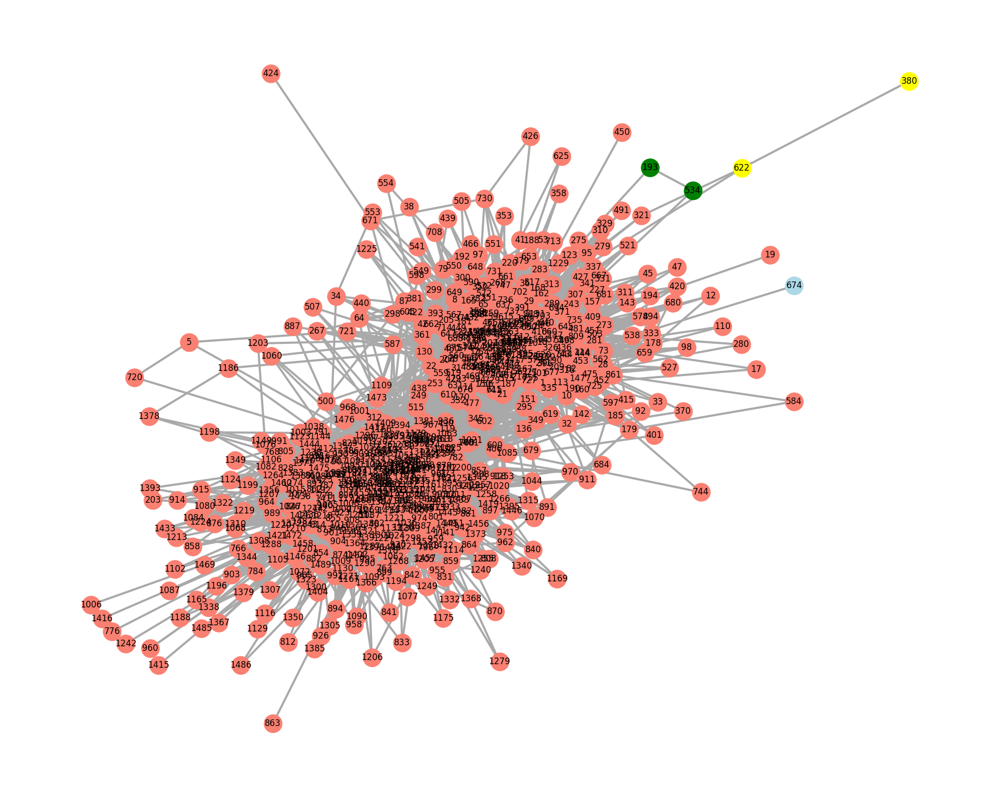

In [41]:
# We have 4 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue','green','yellow']
nx.draw_networkx_edges(G_no_labels, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_d_list, colors):
    nx.draw_networkx_nodes(communities_d_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G_no_labels, pos=pos)
_ = plt.axis('off')

Σε γενικές γραμμές ο αλγόριθμος για το community detection εδώ πέρα δημιουργεί 3 cluster τα οποία αποτελούνται από έναν ή δύο κόμβους. 

# Spectral Clustering 

In [42]:
from sklearn.cluster import SpectralClustering
# Calculating the adjacency matrix of the graph and then finding the labels when using this clustering. 
A_spectral = nx.to_numpy_array(G_no_labels)
spect_clustering = SpectralClustering(n_clusters=2, affinity='precomputed')
labels_spectral = spect_clustering.fit_predict(A_spectral)


# Finally, we save the labels on another column of our dataframe
df['Spectral_Clustering'] = labels_spectral

In [43]:
# And now we want to find the communities so that we can plot the graph
# get the nodes where the value is 1
labels_1 = df.loc[df['Spectral_Clustering'] == 1].index.tolist()

# get the nodes where the value is 0
labels_0 = df.loc[df['Spectral_Clustering'] == 0].index.tolist()

In [44]:
communities_e_list = []
communities_e_list.append(labels_0)
communities_e_list.append(labels_1)

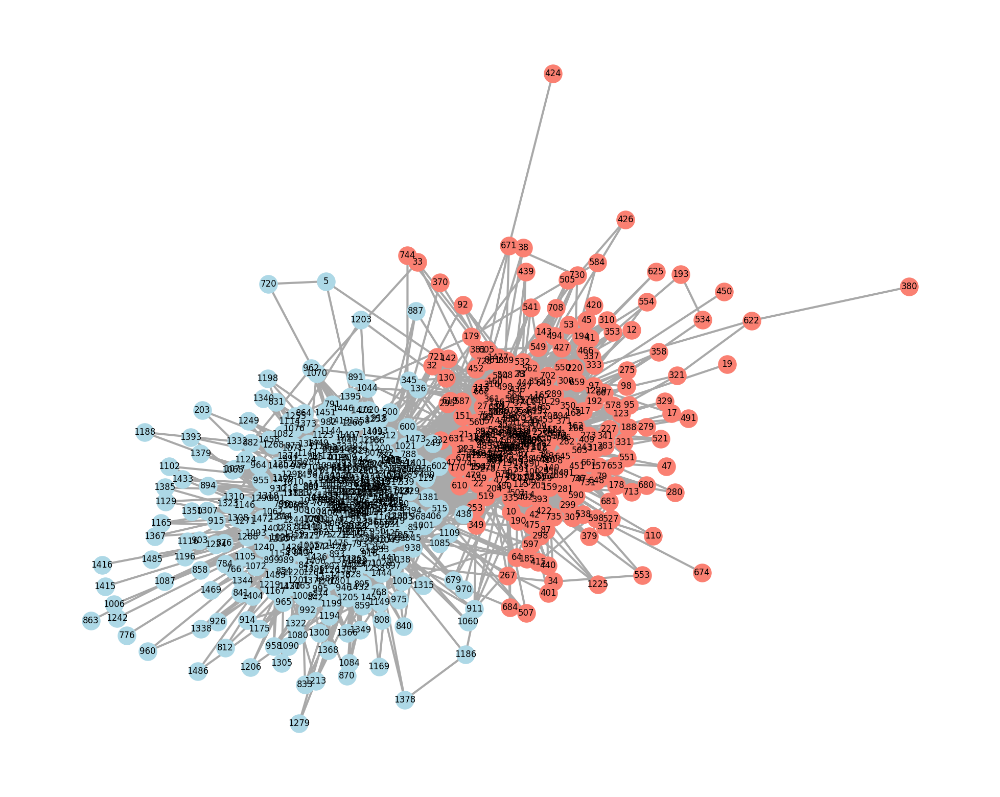

In [45]:
# We have 2 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G_no_labels, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_e_list, colors):
    nx.draw_networkx_nodes(communities_e_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G_no_labels, pos=pos)
_ = plt.axis('off')

Όσον αφορά τις γραφικές παραστάσεις, μπορούμε με σιγουριά να πούμε ότι αυτός ο αλγόριθμος έβγαλε τα καλύτερα αποτελέσματα, αρκεί να το επαληθεύσουμε και από τα αποτελέσματα των μετρικών που περιγράφονται παρακάτω.

# EVALUATION OF CLUSTERING

### PRECISION AND RECALL

In [46]:
 # For informative reasons, we can see that are 442 nodes with 1 as ground truth label and 351 nodes with 0 as ground truth label 
df['ground_truth_labels'].value_counts()

1    442
0    351
Name: ground_truth_labels, dtype: int64

In [47]:
# Function for precision - recall


def precision_recall(communities):
  ''' Takes for argument a list with the desired communities and returns precision and 
  recall values for the given clustering algorithm. I will try to be as much explanatory as I can,
  in order for each step to be easily understandable. 
  '''
  # count_0_list and count_1_ list contains the counts of 1 and 0 for ground truth labels respectively, for all communities found. For example, 
  # if the count_0_list is [6, 436], that means that the first community found has 6 nodes with ground truth label 0, and the second community found has 436 nodes 
  # with ground truth label 1
  count_0_list = []
  count_1_list = []
  for community in communities:
    count_0_number = 0 
    count_1_number = 0
    for node in community:
      if df.loc[node, 'ground_truth_labels'] == 0:
        count_0_number += 1
      else:
        count_1_number += 1
    count_0_list.append(count_0_number)
    count_1_list.append(count_1_number) 

    #TRUE POSITIVES 
  # To find the true positives, we have to use the binomial coefficient, to find how many of the nodes assigned correctly in their cluster 
  
  TP = 0 
  for i in range(len(count_0_list)):
    # Checking the different cases
    
    # If we have one ground truth label 1 and one ground_truth label 0, then we can't count true positives in this community
    if count_0_list[i] == 1 and count_1_list[i] == 1:
      pass

    # If we have a community with a single node, then one value for a specific index must be 0, and again we can't count true positives
    elif (count_0_list[i] == 1 and count_1_list[i] == 0) or (count_0_list[i] == 0 and count_1_list[i] == 0):
      pass
    
    # In any different case, we can calculate true positives
    else:
      #Now we have to check if there is a single node (or there isn't at all) with a specific ground truth label in a community, so that we must not use him to calculate the true positives
      if count_0_list[i] <= 1 and count_1_list[i] > 1 :
        TP += scipy.special.binom(count_1_list[i], 2)

      elif count_1_list[i] <= 1 and count_0_list[i] > 1 :
        TP += scipy.special.binom(count_0_list[i], 2)
      
      # And now the general case: 
      else: 
        TP += scipy.special.binom(count_0_list[i], 2) + scipy.special.binom(count_1_list[i], 2)

  # FALSE POSITIVES 
  # Here, we dont have so many cases, we only have to check if there is a single node in a community, because we can't calculate false positives. 

  FP = 0 
  for i in range(len(count_0_list)):

    # If we have a community with a single node, then one value for a specific index must be 0, and again we can't count false positives
    if (count_0_list[i] == 1 and count_1_list[i] == 0) or (count_0_list[i] == 0 and count_1_list[i] == 0):
      pass

    else: 
      FP += count_0_list[i]*count_1_list[i] 

  
  # FALSE NEGATIVES 
  # Here we actually don't care if a cluster has only one node. 

  FN = 0
  for i in range(len(count_0_list)):
    for j in range(len(count_0_list)):
      if i<j :
        FN += count_0_list[i]*count_0_list[j] + count_1_list[i]*count_1_list[j]

  # Calculating precision and recall
  precision = TP/(TP + FP)
  recall = TP/(TP + FN)

  print('Precision: ' + str(precision))
  print('Recall: ' + str(recall))



# Purity 

In [48]:
def purity(communities):
  ''' Takes for argument a list with the desired communities and returns purity values for the given clustering algorithm.
  '''

   # First of all, we will use again the lists count_0_list and count_1_list.
  count_0_list = []
  count_1_list = []
  for community in communities:
    count_0_number = 0 
    count_1_number = 0
    # if there is a community with a single node we dont have to count it
    for node in community:
      if df.loc[node, 'ground_truth_labels'] == 0:
        count_0_number += 1
      else:
        count_1_number += 1
    count_0_list.append(count_0_number)
    count_1_list.append(count_1_number) 
   
   # We now define the numerator of the type given to calculate purity. We find the number of nodes that are the majority in a community, and then we sum them one by one
  purity_numerator = 0 
  for i in range(len(count_0_list)):
    if count_0_list[i] >= count_1_list[i]:
      purity_numerator += count_0_list[i]
    else:
      purity_numerator += count_1_list[i]

  purity = purity_numerator/len(G.nodes)
  
  print('Purity: ' + str(purity))


# NMI

Εδώ θεώρησα αναγκαίο να εξηγήσω λίγο περισσότερο την διαδικασία που ακολούθησα για τον υπολογσιμό του Normalised Mutual Information. Αρχικά, χρησιμοποίησα τον τύπο που μας παρέχεται στην διαφάνεια 91 των διαφανειών L05-CommunityDetection.pdf . Πιο συγκεκριμένα ο τύπος είναι ο: 
$$NMI = \frac{\sum_{h,l}n_{h,l}log\frac{n\cdot n_{h,l}}{n_hn_l}}{\sqrt{(\sum_hn_hlog\frac{n_h}{n})(\sum_ln_llog\frac{n_l}{n})}} $$

Οπότε πρέπει να περιγράψω τι ακριβώς συμβολίζεται με τι, και ποιες είναι οι μεταβλητές και οι λίστες που χρησιμοποιώ κάθε φορά για να υπολογίσω κάτι. 

Αρχικά, το $n_{h,l}$ συμβολίζει στο community $h$, πόσα nodes με label l υπάρχουν. Το $n$ είναι ο συνολικός αριθμός των nodes, οπότε και τον καταχωρώ χειροκίνητα ίσο με 793. \

Η μεταβλητή $n_h$ συμβολίζει τον αριθμό των nodes που έχει το community $h$, οπότε και τον ατνιστοιχίζω με τα στοιχεία της λίστας που δημιούργησα παρακάτω sum_list.

Η μεταβλητή $n_l$ μετράει πόσα nodes έχουν label $l$, οπότε και το αντιστοιχίζω με το λεξικό actual_labels, κάθε φορά που θα θέλω να χρησιμοποιήσω αυτή την τιμή. 

Οπότε τελικά, αυτό που κάνω εγώ παραλάτω είναι το εξής: 
Υπολογίζω αρχικά τον αριθμητή χρησιμοποιώντας δύο αθροίσματα, αυτό που αντιστοιχεί στο label 0 του κάθε community και αυτό που αντιστοιχεί στο label 1 του κάθε community, και τα αθροίζω για όλα τα community. Στην συνέχεια χωρίζω τον παρονομαστή σε δύο μέρη, ώστε μετά να υπολογίσω την τετραγωνική ρίζα του γινομένου τους. Ελπίζω να εξήγησα επαρκώς το σκεπτικό μου, και να γίνει πιο εύκολη η κατανόηση του κώδικα.

In [49]:
# We already have the actual labels of our graph, that can be found using the command value_counts()
df['ground_truth_labels'].value_counts()

1    442
0    351
Name: ground_truth_labels, dtype: int64

In [50]:
# So now we create the dictionary to use the count of actual labels
actual_labels={0: 351, 1: 442}

In [51]:
def NMI(communities):
  # First of all, we will use once again the lists count_0_list and count_1_list.
  count_0_list = []
  count_1_list = []
  for community in communities:
    count_0_number = 0 
    count_1_number = 0
    for node in community:
      if df.loc[node, 'ground_truth_labels'] == 0:
        count_0_number += 1
      else:
        count_1_number += 1
    count_0_list.append(count_0_number)
    count_1_list.append(count_1_number) 

  # This time we will use another list, that have the sum of each index of our two previous lists, in order to store the nh somewhere.
  sum_list = []
  for i in range(len(count_1_list)):
      sum_list.append(count_1_list[i] + count_0_list[i])

  
  # And now the process I described earlier, using the correct correspondance for each variable in the type.
  NMI_numerator = 0 
  for h in range(len(communities)):
    if count_1_list[h]!=0 and count_0_list[h]!=0:
      NMI_numerator += count_0_list[h]*math.log10((793 * count_0_list[h])/(sum_list[h]*actual_labels[0])) +\
                      count_1_list[h]*math.log10((793 * count_1_list[h])/(sum_list[h]*actual_labels[1]))

  NMI_denominator_1 = 0
  NMI_denominator_2 = 0

  for h in range(len(communities)):
    if count_1_list[h]!=0 and count_0_list[h]!=0:
      NMI_denominator_1 += sum_list[h]* math.log10(sum_list[h] / 793) 


  NMI_denominator_2 = actual_labels[0]*math.log10(actual_labels[0]/793) +\
                      actual_labels[1]*math.log10(actual_labels[1]/793) 

  # Finally calculating the NMI value
  NMI_score = NMI_numerator/math.sqrt(NMI_denominator_2*NMI_denominator_1)

  print('NMI: ' + str(NMI_score))

# Modularity 

Για το συγκεκριμένο υπάρχει έτοιμη συνάρτηση από την βιβλιοθήκη networkx οπότε απλά δημιουργώ την συνάρτηση που θα χρησιμοποιήσω για να εμφανίζω τα αποτελέσματα μου.

In [52]:
def home_made_modularity(communities):
  ground_truth_modularity = nx.algorithms.community.modularity(G, communities_ground_truth)
  community_modularity =  nx.algorithms.community.modularity(G, communities)

  print('Modularity: ' + str(community_modularity) + ' (modularity for our starting graph:  ' + str(ground_truth_modularity) + ')')

# Conductance
Ψάχνοντας για τον ορισμό του conductance, βρήκα ότι το conductance ενός γράφου ορίζεται να είναι ως το ελάχιστο conductance από κάποια subset, οπότε  θα υπολογίσω το conductance όσον αφορά κάθε φορά τα communities που βρέθηκαν από κάθε αλγόριθμο. 

In [53]:
def conductancee(communities):
  # Create a list that stores all condactance instances for each community
  conductances = []
  for com in communities:
    conductances.append(nx.algorithms.cuts.conductance(G, com))

  # Total conductance will be the minimum of all conductance instances found  
  total_conductance = min(conductances)
  
  #Calculating conductance for the first graph
  ground_truth_conductances = []
  for com in communities_ground_truth:
    ground_truth_conductances.append(nx.algorithms.cuts.conductance(G, com))
  conductance_ground_truth = min(ground_truth_conductances)
  
  print('Conductance: ' + str(total_conductance) + ' (conductance for our starting graph:  ' + str(conductance_ground_truth) + ')')

# Density 

Στην συγκεκριμένη περίπτωση,δημιουργώ την συνάρτηση η οποία υπολογίζει το average density του graph, αφού πρώτα δημιουργήσω μία λίστα η οποία αποθηκεύει όλα τα densities για τον υπογράφο που έχει σαν nodes, αυτά που υπάρχουν στο ίδιο community που βρίσκει ο κάθε αλγόριθμος. 

In [54]:
def density(communities):
  # Create a list that stores all density instances for each community of our graph
  densities = []
  for com in communities:
    densities.append( nx.density(G.subgraph(com)))

  # Density of a graph will be the average of all densities found
  average_density = sum(densities)/len(densities)

    #Calculating density using the same way as before
  ground_truth_densities = []
  for com in communities_ground_truth:
    ground_truth_densities.append(nx.density(G.subgraph(com)))

  density_ground_truth = sum(ground_truth_densities)/len(ground_truth_densities)

  print('Density of graph: ' + str(average_density ) + ' (density for our starting graph: ' + str(density_ground_truth) + ')')



In [55]:
# And here we are plotting the metrics values
print('Evaluation Metrics for Clique Method ')
print('------------------------------------')
precision_recall(communities_a_list)
purity(communities_a_list)
NMI(communities_a_list)
home_made_modularity(communities_a_list)
conductancee(communities_a_list)
density(communities_a_list)
print('------------------------------------')

print('Evaluation Metrics for Max Modularity Method ')
precision_recall(communities_b_list)
purity(communities_b_list)
NMI(communities_b_list)
home_made_modularity(communities_b_list)
conductancee(communities_b_list)
density(communities_b_list)
print('------------------------------------')

print('Evaluation Metrics for Agglomerative Clustering ')
precision_recall(communities_c_list)
purity(communities_c_list)
NMI(communities_c_list)
home_made_modularity(communities_c_list)
conductancee(communities_c_list)
density(communities_c_list)
print('------------------------------------')

print('Evaluation Metrics for Devisive Hierarchical Clustering ')
precision_recall(communities_d_list)
purity(communities_d_list)
NMI(communities_d_list)
home_made_modularity(communities_d_list)
conductancee(communities_d_list)
density(communities_d_list)
print('------------------------------------')

print('Evaluation Metrics for Spectral Clustering ')
precision_recall(communities_e_list)
purity(communities_e_list)
NMI(communities_e_list)
home_made_modularity(communities_e_list)
conductancee(communities_e_list)
density(communities_e_list)
print('------------------------------------')

Evaluation Metrics for Clique Method 
------------------------------------
Precision: 0.7642129786194717
Recall: 0.12800372594187026
Purity: 0.9218158890290038
NMI: 0.09633297292409562
Modularity: 0.05339564657810598 (modularity for our starting graph:  0.41509812472930163)
Conductance: 0.5410426753743948 (conductance for our starting graph:  0.0875298835505514)
Density of graph: 0.1675263467470028 (density for our starting graph: 0.08116949343840099)
------------------------------------
Evaluation Metrics for Max Modularity Method 
Precision: 0.9360890603750909
Recall: 0.9314288231814005
Purity: 0.9684741488020177
NMI: 0.7930486996533759
Modularity: 0.43341141325417326 (modularity for our starting graph:  0.41509812472930163)
Conductance: 0.06909894969596463 (conductance for our starting graph:  0.0875298835505514)
Density of graph: 0.45921037928682495 (density for our starting graph: 0.08116949343840099)
------------------------------------
Evaluation Metrics for Agglomerative Cluste

Παρακάτω θα φαίνεται και ο πίνακας με τα συγκριτικά αποτελέσματα (στρογγυλοποιημένα στα εκατοστά), προκειμένου να εξάγουμε και τα συμπεράσματα μας πιο εύκολα. 





\begin{array}{llllllll}
Algorithm                              & Precision & Recall & Purity & NMI    & Modularity & Conductance & Density \\
Clique         & 0.764     & 0.128  & 0.922  & 0.096  & 0.053      & 0.541       & 0.168   \\
Max Modularity & 0.936     & 0.931  & 0.968  & 0.793  & 0.433      & 0.069       & 0.459   \\
Agglomerative  & 0.545     & 0.845  & 0.68   & 0.039  & 0.181      & 0.399       & 0.280   \\
Devisive       & 0.507     & 0.989  & 0.564  & 0.0003 & 0.0002     & 0.5         & 0.511   \\
Spectral       & 0.941     & 0.948  & 0.971  & 0.814  & 0.433      & 0.069       & 0.083  
\end{array}


### Σύγκριση αποτελεσμάτων

Όπως μπορούμε να δούμε, ο αλγόριθμος spectral clustering έβγαλε εμφανώς τα καλύτερα αποτελέσματα συγκριτικά με τους υπόλοιπους αλγορίθμους, πέρα από τον αλγόριθμο για μεγιστοποίηση του modularity.

Πιο συγκεκριμένα, τα precision και recall μπορούμε να παρατηρήσουμε ότι στους περισσότερους αλγόριθμους βγάζει κακά αποτελέσματα. Το γεγονός ότι με το Devisive Hierarchical clustering, η τιμή του recall είναι η πιο υψηλή από όλες δικαιολογείται, καθώς από τον αρχικό γράφο χώριζε μόνο ένα ή δύο κόμβους από την υπόλοιπη αρχιτεκτονική. Όμως για τον αλγόριθμο max modularity και για τον spectral, τα αποτελέσματα των δύο αυτών μετρικών είναι πολύ υψηλά.

Η τιμή του purity βλέπουμε ότι είναι αρκετά υψηλή, ανεξαρτήτως του αλγορίθμου που χρησιμοποιήθηκε, με την χειρότερη από αυτές να είναι όταν χρησιμοποιήσαμε τον διαιρετικό αλγόριθμο, και την καλύτερη να εμφανίστηκε όταν χρησιμοποιήσαμε το spectral clustering.

Για το Normalised Mutual Information το μόνο που μπορούμε να πούμε είναι ότι για ακόμα μία φορά όλοι οι αλγόριθμοι έβγαλαν χειρότερα αποτελέσματα συγκριτικά με τον spectral, με τον χειρότερο από αυτούς να είναι για ακόμα μία φορά ο διαιρετικός αλγόριθμος. 

Όσον αφορά το modularity, προφανώς και ο αλγόριθμος που μεγιστοποιεί το modularity ήταν ο καλύτερος από όλους, με τον spectral να ακολουθεί δεύτερος, και μάλιστα να απέχει μόλις 0.0002 από τον πρώτο. Ο διαιρετικός αλγόριθμος για ακόμα μία φορά βλέπουμε ότι έχει πολύ κακά αποτελέσματα όσον αφορά και αυτην την μετρική.

Για το conductance, βλέπουμε ότι ο spectral αλγόριθμος έβγαλε τα καλύτερα αποτελέσματα, όσον αφορά το γεγονός ότι είναι πολύ κοντά στην τιμή του conductance για τον αρχικό μας γράφο, κάτι το οποίο ισχύει και για το density. 


# PART 2

Σε αυτό το μέρος της εργασίας πρέπει να δημιουργήσουμε 3 συνθετικά δίκτυα. Για το πρώτο, θέλουμε να προσεγγίσουμε ένα μοντέλο Barabasi ALbert, για το οποίο θα χρησιμοποιήσουμε τιμή του p σχετικά μικρή και ίση με 0.01, προκειμένου να μην υπάρξουν πολλά τρίγωνα στον γράφο. Για τον τρίτο γράφο θα χρησιμοποιήσουμε λίγο μεγαλύτερη τιμή για το p, για το οποίο θα είναι p = 0.2, και για τον δεύτερο γράφο, χρησιμοποιούμε μία ενδιάμεση τιμή για το p, και πιο συγκεκριμένα p = 0.1. Και για τις 3 επιλογές των γράφων χρησιμοποιούμε την ίδια τιμή για την μεταβλητή m, η οποία θα είναι ίση με 35, καθώς το m είναι ο αριθμός των κόμβων με τον οποίο συνδέεται κάθε κόμβος που προστίθεται, και όπως αναφέρεται και παρακάτω, ο μέσος βαθμός των κόμβων στο γράφο είναι 34.06. 

Κάποιες επιπλεόν παραδοχές για να γίνει πιο κατανοητός ο κώδικας είναι οι εξής: 


*   Το όνομα με τον οποίο ορίζεται κάθε φορά ο κάθε γράφος θα είναι G1, G2, G3, αντίστοιχα για τον πρώτο, δεύτερο και τρίτο γράφο που δημιουργούμε,
*   Κάθε φορά τα communities που παράγονται θα τα ονομάζουμε communities_i_j_list, όπου με i θα συμβολίζουμε τον κάθε γράφο, δηλαδή i=1, 2, 3, και j θα συμβολίζουμε την μέθοδο clustering που θέλουμε να χρησιμοποιήσουμε, σε αντιστοιχία με το πρώτο μέρος της εργασίας. Δηλαδή θα χρησιμοποιούμε j = b ή e , όπου b θα είναι για το max modularity και e για το spectral clustering.




In [56]:
# We will calculate the average degree of the graph, in order to find the value for the variable m
sum_degree = 0
for node in G.nodes:
  sum_degree += G.degree(node)

average_degree = sum_degree/len(G.nodes)
print('Average degree of our starting graph: ' + str(average_degree))

Average degree of our starting graph: 34.01261034047919


In [84]:
# Here we define our graphs
G1 = nx.powerlaw_cluster_graph(1500, 35, 0.10, seed = 21)
G2 = nx.powerlaw_cluster_graph(1500, 35, 0.5, seed = 22)
G3 = nx.powerlaw_cluster_graph(1500, 35, 0.9, seed = 23)

In [93]:
#Clauset-Newman-Moore greedy modularity maximization
communities_1_b_list = list(nx.algorithms.community.greedy_modularity_communities(G1))

In [94]:
len(communities_1_b_list)

4

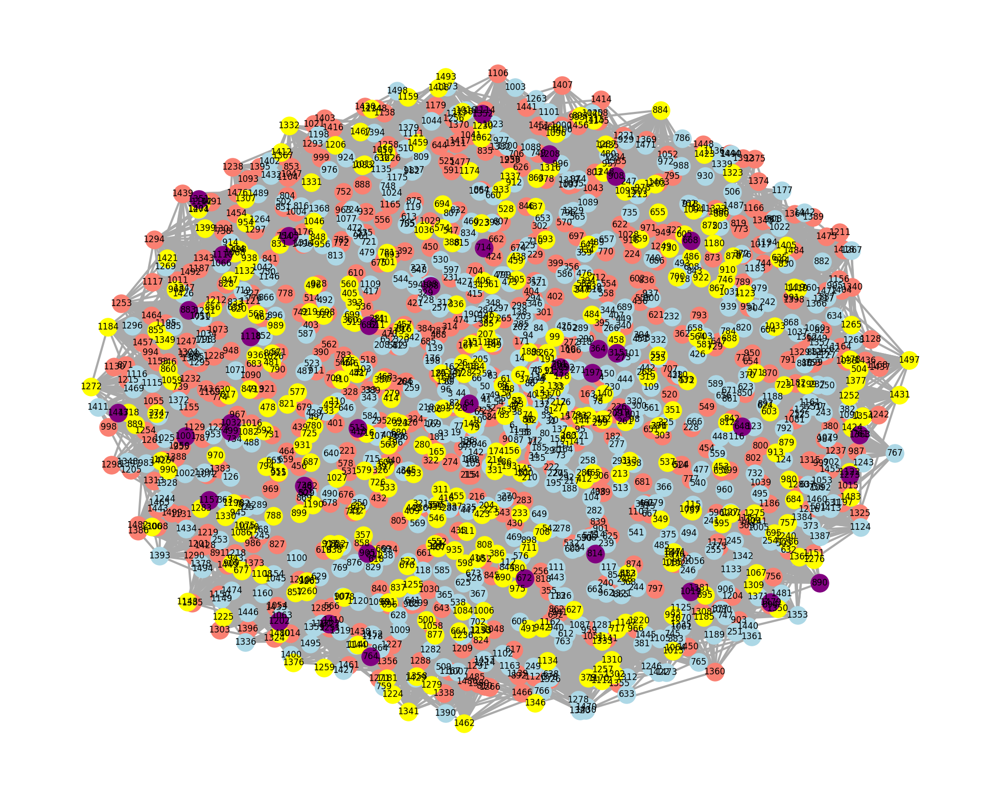

In [95]:
# We have 4 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G1)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue','yellow','purple']
nx.draw_networkx_edges(G1, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_1_b_list, colors):
    nx.draw_networkx_nodes(G1, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G1, pos=pos)
_ = plt.axis('off')

In [96]:
# Creating again the label_dict to store the label of each cluster
label_dict_1_b={}
for i, j in enumerate(communities_1_b_list):
  for value in j:
    label_dict_1_b[value] = i


In [97]:
#Spectral
# Convert the graph to an adjacency matrix
A_spectral_1 = nx.to_numpy_array(G1)
spect_clustering_1 = SpectralClustering(n_clusters=2, affinity='precomputed')
labels_spectral_1 = spect_clustering_1.fit_predict(A_spectral_1)

df_2 = pd.DataFrame({'Spectral_clustering_1': labels_spectral_1})




In [98]:
# And now we want to find the communities so that we can plot the graph
# get the nodes where the value is 1
labels_1 = df_2.loc[df_2['Spectral_clustering_1'] == 1].index.tolist()

# get the nodes where the value is 0
labels_0 = df_2.loc[df_2['Spectral_clustering_1'] == 0].index.tolist()

In [99]:
communities_1_e_list = []
communities_1_e_list.append(labels_0)
communities_1_e_list.append(labels_1)

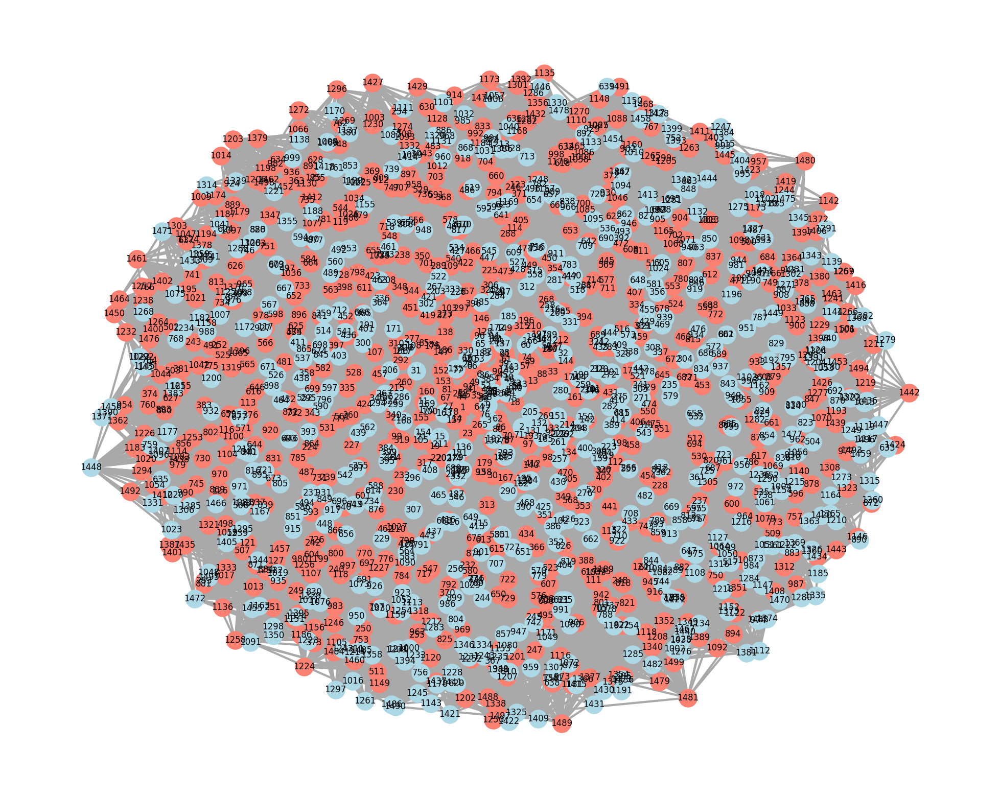

In [100]:
# We have 2 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G1)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G1, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_1_e_list, colors):
    nx.draw_networkx_nodes(communities_1_e_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G1, pos=pos)
_ = plt.axis('off')

In [101]:
def home_made_modularity_part_2(graph,communities):
  community_modularity =  nx.algorithms.community.modularity(graph, communities)

  print('Modularity: ' + str(community_modularity) )

In [102]:
def conductance_part_2(graph,communities):
  # Create a list that stores all condactance instances for each community
  conductances = []
  for com in communities:
    conductances.append(nx.algorithms.cuts.conductance(graph, com))

  # Total conductance will be the minimum of all conductance instances found  
  total_conductance = min(conductances)
  
  #Calculating conductance for the first graph
  ground_truth_conductances = []
  for com in communities_ground_truth:
    ground_truth_conductances.append(nx.algorithms.cuts.conductance(G, com))
  conductance_ground_truth = min(ground_truth_conductances)
  
  print('Conductance: ' + str(total_conductance))

In [103]:
def density_part_2(graph,communities):
  # Create a list that stores all density instances for each community of our graph
  densities = []
  for com in communities:
    densities.append( nx.density(graph.subgraph(com)))

  # Density of a graph will be the average of all densities found
  average_density = sum(densities)/len(densities)

  print('Density of graph: ' + str(average_density ))

Για τον δεύτερο γράφο που δημιουργήσαμε...

In [104]:
#Clauset-Newman-Moore greedy modularity maximization
communities_2_b_list = list(nx.algorithms.community.greedy_modularity_communities(G2))

In [105]:
len(communities_2_b_list)

5

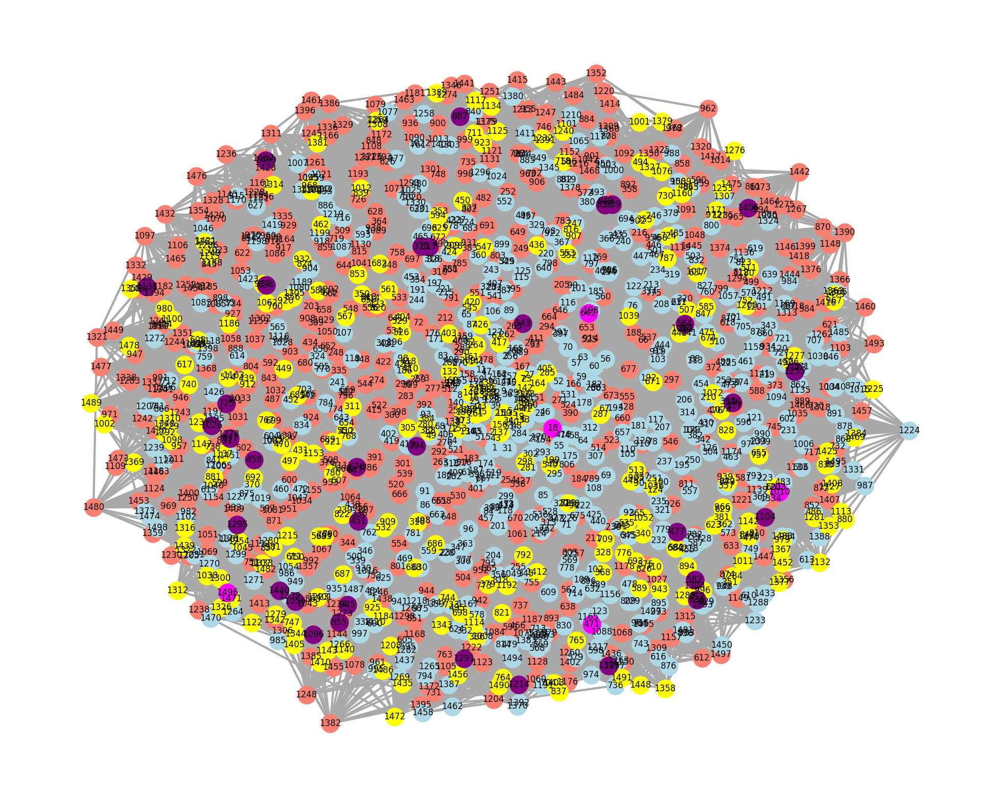

In [106]:
# We have 5 communities so we are using five colors in order to plot the graph
pos = nx.spring_layout(G2)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue','yellow','purple','magenta']
nx.draw_networkx_edges(G2, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_2_b_list, colors):
    nx.draw_networkx_nodes(G2, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G2, pos=pos)
_ = plt.axis('off')

In [107]:
#Spectral
# Convert the graph to an adjacency matrix
A_spectral_2 = nx.to_numpy_array(G2)
spect_clustering_2 = SpectralClustering(n_clusters=2, affinity='precomputed')
labels_spectral_2 = spect_clustering_2.fit_predict(A_spectral_2)

df_2 ['Spectral_clustering_2'] = labels_spectral_2



In [108]:
# And now we want to find the communities so that we can plot the graph
# get the nodes where the value is 1
labels_1 = df_2.loc[df_2['Spectral_clustering_2'] == 1].index.tolist()

# get the nodes where the value is 0
labels_0 = df_2.loc[df_2['Spectral_clustering_2'] == 0].index.tolist()

In [109]:
communities_2_e_list = []
communities_2_e_list.append(labels_0)
communities_2_e_list.append(labels_1)

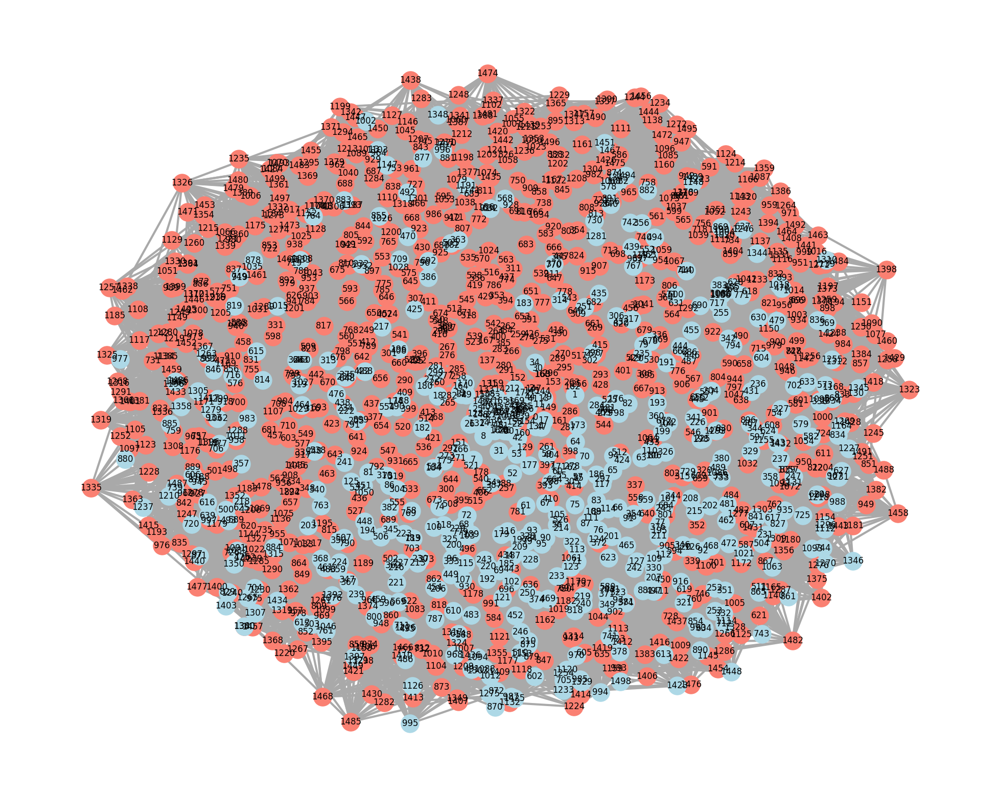

In [110]:
# We have 2 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G2)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G2, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_2_e_list, colors):
    nx.draw_networkx_nodes(communities_2_e_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G2, pos=pos)
_ = plt.axis('off')

Και τέλος για τον τρίτο γράφο...

In [85]:
#Clauset-Newman-Moore greedy modularity maximization
communities_3_b_list = list(nx.algorithms.community.greedy_modularity_communities(G3))

In [86]:
len(communities_3_b_list)

4

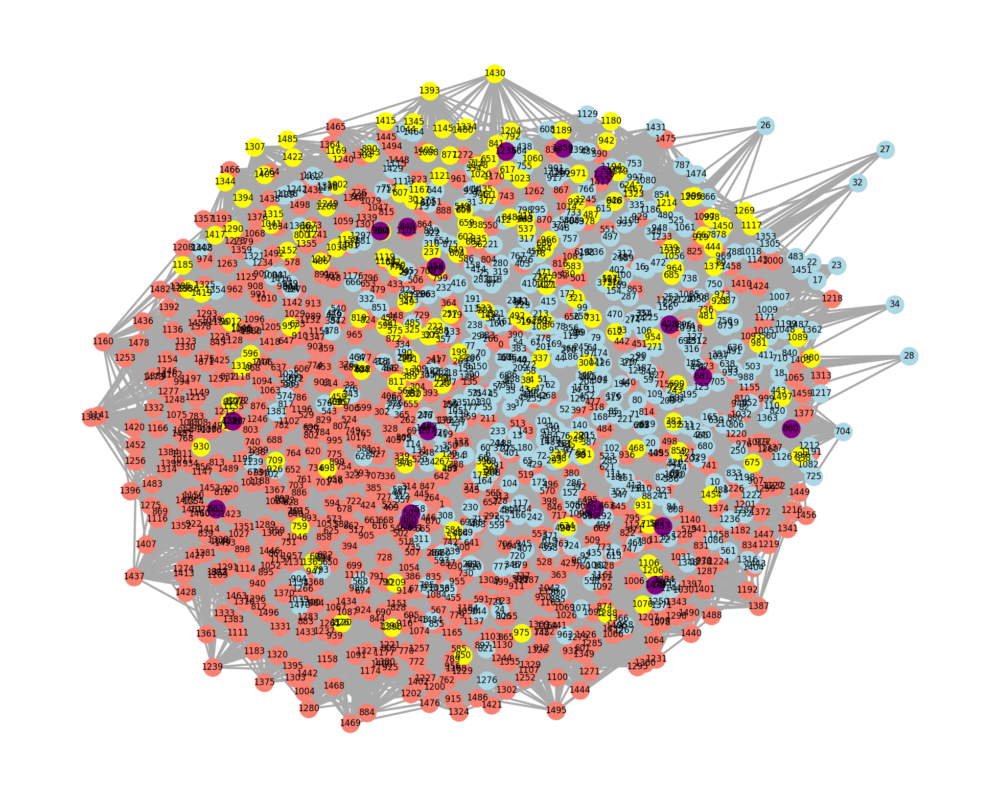

In [87]:
# We have 4 communities so we are using six colors in order to plot the graph
pos = nx.spring_layout(G3)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue','yellow','purple']
nx.draw_networkx_edges(G3, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_3_b_list, colors):
    nx.draw_networkx_nodes(G3, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G3, pos=pos)
_ = plt.axis('off')

In [88]:
#Spectral
# Convert the graph to an adjacency matrix
A_spectral_3 = nx.to_numpy_array(G3)
spect_clustering_3 = SpectralClustering(n_clusters=2, affinity='precomputed')
labels_spectral_3 = spect_clustering_3.fit_predict(A_spectral_3)

df_2 ['Spectral_clustering_3'] = labels_spectral_3


In [89]:
# And now we want to find the communities so that we can plot the graph
# get the nodes where the value is 1
labels_1 = df_2.loc[df_2['Spectral_clustering_3'] == 1].index.tolist()

# get the nodes where the value is 0
labels_0 = df_2.loc[df_2['Spectral_clustering_3'] == 0].index.tolist()

In [90]:
communities_3_e_list = []
communities_3_e_list.append(labels_0)
communities_3_e_list.append(labels_1)

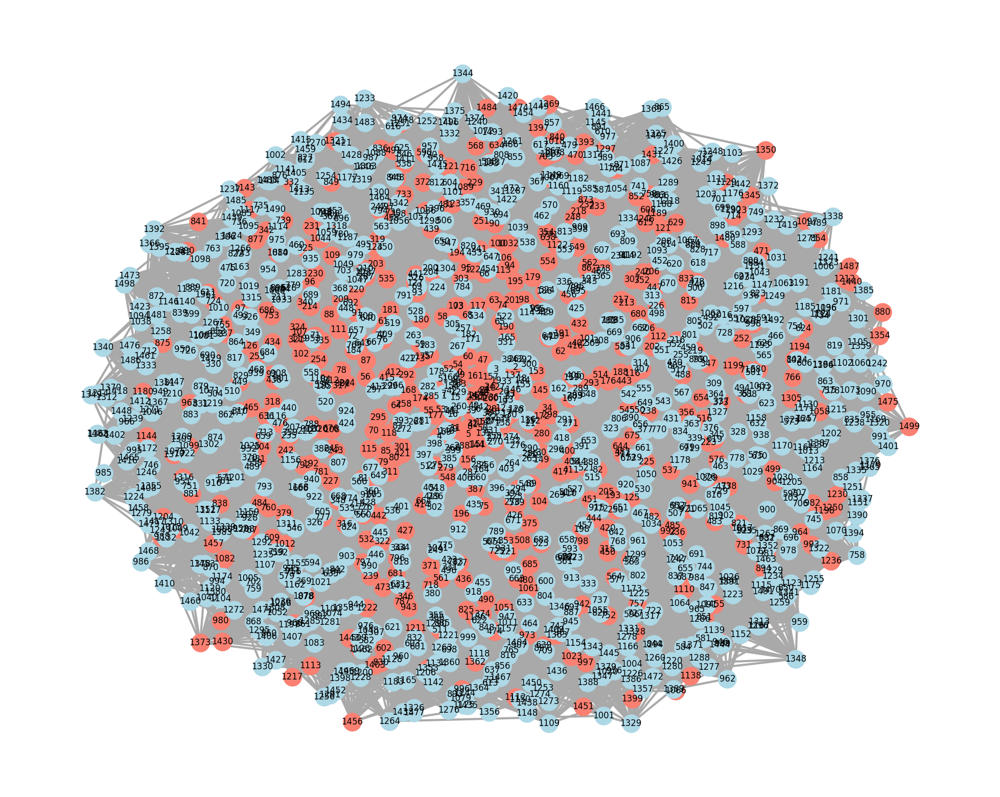

In [91]:
# We have 2 communities so we are using four colors in order to plot the graph
pos = nx.spring_layout(G2)
plt.figure(figsize=(25,20))
colors = ['salmon', 'lightblue']
nx.draw_networkx_edges(G3, pos=pos, width=3, edge_color='darkgray')
for community, color in zip(communities_3_e_list, colors):
    nx.draw_networkx_nodes(communities_3_e_list, pos=pos, nodelist=community, node_color=color, node_size=640)
nx.draw_networkx_labels(G3, pos=pos)
_ = plt.axis('off')

In [111]:
print('Evaluation Metrics for G1 with max modularity method ')
print('------------------------------------')
home_made_modularity_part_2(G1, communities_1_b_list)
conductance_part_2(G1, communities_1_b_list)
density_part_2(G1, communities_1_b_list)
print('------------------------------------')
print('Evaluation Metrics for G1 with spectral clustering method ')
print('------------------------------------')
home_made_modularity_part_2(G1, communities_1_e_list)
conductance_part_2(G1, communities_1_e_list)
density_part_2(G1, communities_1_e_list)
print('------------------------------------')
print('------------------------------------')
print('------------------------------------')
print('Evaluation Metrics for G2 with max modularity method ')
print('------------------------------------')
home_made_modularity_part_2(G2, communities_2_b_list)
conductance_part_2(G2, communities_2_b_list)
density_part_2(G2, communities_2_b_list)
print('------------------------------------')
print('Evaluation Metrics for G2 with spectral clustering method ')
print('------------------------------------')
home_made_modularity_part_2(G2, communities_2_e_list)
conductance_part_2(G2, communities_2_e_list)
density_part_2(G2, communities_2_e_list)
print('------------------------------------')
print('------------------------------------')
print('------------------------------------')
print('Evaluation Metrics for G3 with max modularity method ')
print('------------------------------------')
home_made_modularity_part_2(G3, communities_3_b_list)
conductance_part_2(G3, communities_3_b_list)
density_part_2(G3, communities_3_b_list)
print('------------------------------------')
print('Evaluation Metrics for G3 with spectral clustering method ')
print('------------------------------------')
home_made_modularity_part_2(G3, communities_3_e_list)
conductance_part_2(G3, communities_3_e_list)
density_part_2(G3, communities_3_e_list)
print('------------------------------------')

Evaluation Metrics for G1 with max modularity method 
------------------------------------
Modularity: 0.08668551214852972
Conductance: 0.5048814837801064
Density of graph: 0.07506313842466378
------------------------------------
Evaluation Metrics for G1 with spectral clustering method 
------------------------------------
Modularity: 0.06670321658076053
Conductance: 0.5427959866220736
Density of graph: 0.05115863516798917
------------------------------------
------------------------------------
------------------------------------
Evaluation Metrics for G2 with max modularity method 
------------------------------------
Modularity: 0.09911171693000491
Conductance: 0.4764810815885832
Density of graph: 0.13585459093264082
------------------------------------
Evaluation Metrics for G2 with spectral clustering method 
------------------------------------
Modularity: 0.08981564651260676
Conductance: 0.4909463273308524
Density of graph: 0.0640173958057893
----------------------------------


\begin{array}{llll}
(Algorithm, Graph)   & Modularity & Conductance & Density \\
(Max Modularity, G1) & 0.087       & 0.505       & 0.075   \\
(Spectral, G1)       & 0.066       & 0.543       & 0.051   \\
(Max Modularity, G2) & 0.099       & 0.476       & 0.135   \\
(Spectral, G2)       & 0.09       & 0.490         & 0.064   \\
(Max Modularity, G3) & 0.138       & 0.377      & 0.091   \\
(Spectral, G3)       & 0.126       & 0.404       & 0.065 
\end{array}


Εδώ πέρα μπορούμε να παρατηρήσουμε, κάτι το οποίο φαίνεται και μέσα από την παράσταση του κάθε γράφου με χρωματισμένο το κάθε community, ότι οι αλγόριθμοι μας δεν βρίσκοταν σε θέση να αναγνωρίσουν εύκολα τις κοινότητες του κάθε γράφου. 

Πιο συγκεκριμένα, ενώ στο προηγούμενο μέρος της εργασίας μπορούσαμε να εντοπίσουμε τις κοινότητες με τιμές για το modularity έως και 0.44, για το conductance 0.069, και για το density 0.450, οι καλύτερες τιμές των μετρικών αυτών για τους τρεις γράφους ήταν 0.138, 0.377 και 0,135 αντίσοτιχα. 

Σε αυτό το μέρος της εργασίας μπορούμε να παρατηρήσουμε ότι η εύρεση κοινοτήων, ειδικά όταν έχουμε να επεξεργαστούμε 1500 κόμβους είναι δύσκολη υπόθεση. 

Άξιο παρατήρησης αποτελεί το γεγονός ότι τα αποτελέσματα για αυτούς τους γράφους, γινόταν καλύτερα, όσο ανέβαινε και η τιμή της μεταβλητής p, στην αρχικοποίησή τους. Μπορούμε να παρατηρήσουμε ότι τα καλύτερα αποτελέσματα για community detection τα βγάλαμε όταν χρησιμοποιούσαμε τον τρίτο γράφο, αυτόν δηλάδή όπου η τιμή του p ήταν ίση με 0.9 (ίσως σε εξαίρεση με την τιμή του density για τον δεύτερο γράφο. Αυτό συμβαίνειλόγω των πολλών τριγόνων που δημιουργούνται μεταξύ των nodes, κάνοντας έτσι την αναζήτηση community στον γράφο πιο εύκολη.